Gerador de Dados

In [1]:
import pandas as pd
import numpy as np
import os
import openpyxl
import geopandas as gpd
import matplotlib.pyplot as plt
import seaborn as sns
import fiona

In [2]:
n_clusters_cd = 3
n_clusters_pa = 120
list_state = ['SP']
lista_meses = ['Jan', 'Fev', 'Mar' , 'Abr', 'Mai', 'Jun', 'Jul', 'Ago', 'Set', 'Out', 'Nov', 'Dez']
#'Jan', 'Fev', 'Mar' , 'Abr', 'Mai', 'Jun', 'Jul', 'Ago', 'Set', 'Out', 'Nov', 'Dez'

dem_inferida = (20000000) #20000000
# n_cidades = 450
Custo_estq = 1000
print(dem_inferida)

20000000


In [3]:
raw_dir = rf'D:\OneDrive\Documentos\Materiais didáticos\MECAI\Dissertação\script\IBGE'

estado_dir = 'estados.csv'
complete_estado_dir = os.path.join(raw_dir, estado_dir)
df_uf = pd.read_csv(complete_estado_dir)

cidades_dir = 'municipios.csv'
complete_cidades_dir = os.path.join(raw_dir, cidades_dir)
df_cidades = pd.read_csv(complete_cidades_dir)

pop_dir = 'tabela4714_pop_2022_Brasil.csv'
complete_pop_dir = os.path.join(raw_dir, pop_dir)
df_pop = pd.read_csv(complete_pop_dir, sep=';')
df_pop = df_pop.loc[:, ['Cód.', 'Pop_2022']]
df_pop['Pop_2022'] = df_pop['Pop_2022'].str.replace('.', '').astype('float')

# aer_dir = 'LIG_AEREAS_2019-2020_rede_carga.xlsx'
# complete_aer_dir = os.path.join(raw_dir, aer_dir)
# df_aer = pd.read_excel(complete_aer_dir)
# df_aer = df_aer.loc[:,['COD_CIDADE', 'NIVEL_AEREO']]

reg_dir = 'Regioes_Geograficas_IBGE_Composicao_por_municipios.xls'
complete_aer_dir = os.path.join(raw_dir, reg_dir)
df_reg_dir = pd.read_excel(complete_aer_dir, sheet_name="BR")
df_reg_dir['Nome da Região Intermediária'] = df_reg_dir['Nome da Região Intermediária'].fillna(method='ffill')
df_reg_dir['Nome da Região Imediata'] = df_reg_dir['Nome da Região Imediata'].fillna(method='ffill')
df_reg_dir = df_reg_dir.iloc[:-1].copy()

result_dir = 'pop_result.csv'
comp_res_dir = os.path.join(raw_dir, result_dir)

def renomear_colunas(df, column_mapping):
    return df.rename(columns=column_mapping)

C:\Users\rpafe\AppData\Local\Temp\ipykernel_23232\1486596568.py:25: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df_reg_dir['Nome da Região Intermediária'] = df_reg_dir['Nome da Região Intermediária'].fillna(method='ffill')
C:\Users\rpafe\AppData\Local\Temp\ipykernel_23232\1486596568.py:26: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df_reg_dir['Nome da Região Imediata'] = df_reg_dir['Nome da Região Imediata'].fillna(method='ffill')


In [4]:
dict_col_uf = {'nome':'nome_uf', 'latitude':'latitude_uf', 'longitude':'longitude_uf'}
df_uf = renomear_colunas(df_uf, dict_col_uf)

dict_col_cidade = {'nome':'nome_cidade', 'latitude':'latitude_cidade', 'longitude':'longitude_cidade'}
df_cidades = renomear_colunas(df_cidades, dict_col_cidade)

In [5]:
df_uf_cidade = pd.merge(df_uf, df_cidades, how='inner', on='codigo_uf')
df_uf_cid_pop = pd.merge(df_uf_cidade, df_pop, how='left', left_on='codigo_ibge', right_on='Cód.')

populacao_total = df_uf_cid_pop['Pop_2022'].sum()

if len(list_state) > 0:
    df_uf_cid_pop = df_uf_cid_pop.loc[df_uf_cid_pop['uf'].isin(list_state),:]

if 'n_cidades' in globals():
    df_uf_cid_pop = df_uf_cid_pop.iloc[:n_cidades,:]

df_uf_cid_pop.to_csv(comp_res_dir, index=False)
dict_uf = {uf:uf_txt for uf, uf_txt in zip(df_uf_cid_pop['uf'], df_uf_cid_pop['nome_uf'])}
# df_uf_cid_pop = df_uf_cid_pop.merge(df_aer, how='left', left_on='Cód.', right_on='COD_CIDADE')
# df_uf_cid_pop.drop(columns=['COD_CIDADE'], inplace=True)
# df_uf_cid_pop.loc[:,['NIVEL_AEREO']] = df_uf_cid_pop.loc[:,['NIVEL_AEREO']].fillna(df_uf_cid_pop.loc[:,['NIVEL_AEREO']].max())

df_uf_cid_pop['codigo_ibge'] = df_uf_cid_pop['codigo_ibge'].astype(str)
df_reg_dir['Cód. IBGE'] = df_reg_dir['Cód. IBGE'].astype(str)
df_uf_cid_pop = df_uf_cid_pop.merge(df_reg_dir, how='left', left_on='codigo_ibge', right_on='Cód. IBGE')

fator_pop_uf = df_uf_cid_pop['Pop_2022'].sum()/populacao_total

In [6]:
# Supondo que df_uf_cid_pop já está carregado
# df_uf_cid_pop = pd.read_csv('seu_arquivo.csv') # ou de onde seus dados vêm

# Garantir que 'Pop_2022' é numérica
df_uf_cid_pop['Pop_2022'] = pd.to_numeric(df_uf_cid_pop['Pop_2022'], errors='coerce')

# Remover linhas com valores nulos na população, se houver
df_uf_cid_pop.dropna(subset=['Pop_2022'], inplace=True)

# 1. Verificar a quantidade de municípios dentro das regiões imediatas
municipios_por_regiao_imediata = df_uf_cid_pop.groupby('Nome da Região Imediata')['codigo_ibge'].nunique().reset_index()
municipios_por_regiao_imediata.rename(columns={'codigo_ibge': 'Quantidade de Municipios'}, inplace=True)

# Criar uma cópia do dataframe para trabalhar e evitar SettingWithCopyWarning
df_recalc = df_uf_cid_pop.copy()

# Inicializar a coluna 'Pop_2022_Recalc'
df_recalc['Pop_2022_Recalc'] = df_recalc['Pop_2022']

# Dicionário para armazenar a população eliminada por região imediata
populacao_eliminada_por_regiao = {}

# Agrupar por 'Nome da Região Imediata' e processar cada grupo
for regiao, group in df_recalc.groupby('Nome da Região Imediata'):
    # Ordenar o grupo pela população em ordem crescente
    group_sorted = group.sort_values(by='Pop_2022', ascending=True)

    # Calcular a quantidade de municípios a serem eliminados (arredondar para cima para garantir pelo menos metade)
    num_municipios_to_eliminate = int(np.ceil(len(group_sorted) / 2))

    # Identificar os municípios a serem eliminados (metade menor)
    municipios_a_eliminar = group_sorted.head(num_municipios_to_eliminate)

    # Calcular a população total a ser eliminada nesta região
    populacao_eliminada_na_regiao = municipios_a_eliminar['Pop_2022'].sum()
    populacao_eliminada_por_regiao[regiao] = populacao_eliminada_na_regiao

    # Identificar os municípios remanescentes
    municipios_remanescentes = group_sorted.tail(len(group_sorted) - num_municipios_to_eliminate)

    # Se não houver municípios remanescentes (ocorre se a região tem apenas 1 município e é eliminado)
    if municipios_remanescentes.empty:
        # Neste caso, a população eliminada é toda a população do município.
        # Não há para quem redistribuir. O município é simplesmente excluído.
        # Marcar esses municípios para remoção completa do dataframe final
        df_recalc.loc[group.index, 'excluir'] = True
        continue

    # Calcular a soma da população dos municípios remanescentes (base para a proporção)
    soma_pop_remanescentes = municipios_remanescentes['Pop_2022'].sum()

    # Distribuir a população eliminada proporcionalmente para os municípios remanescentes
    if soma_pop_remanescentes > 0: # Evitar divisão por zero
        proporcao_distribuicao = municipios_remanescentes['Pop_2022'] / soma_pop_remanescentes
        pop_adicional_por_municipio = proporcao_distribuicao * populacao_eliminada_na_regiao

        # Atualizar 'Pop_2022_Recalc' para os municípios remanescentes
        df_recalc.loc[municipios_remanescentes.index, 'Pop_2022_Recalc'] += pop_adicional_por_municipio
    else:
        # Se a soma da população dos remanescentes for zero, não há para quem distribuir
        # Isso pode acontecer em cenários muito específicos, mas é bom ter um tratamento.
        pass

    # Marcar os municípios que foram eliminados para remoção posterior
    df_recalc.loc[municipios_a_eliminar.index, 'excluir'] = True


# Filtrar o DataFrame para remover os municípios que foram eliminados
df_final = df_recalc[df_recalc['excluir'] != True].copy()

# Remover a coluna auxiliar 'excluir'
df_final.drop(columns=['excluir'], inplace=True)

df_uf_cid_pop = df_final.copy()
df_uf_cid_pop.drop(columns=['Pop_2022'], inplace=True)
df_uf_cid_pop = df_uf_cid_pop.rename(columns={'Pop_2022_Recalc': 'Pop_2022'})
df_uf_cid_pop['ZD'] = [f'ZD_{(i+1):04d}' for i, row in df_uf_cid_pop.iterrows()]
df_uf_cid_pop = df_uf_cid_pop.reset_index(drop=True)
del df_final

In [7]:
def filtrar_cidades_principais(df, n_cidades_por_regiao=2, regioes_especiais=None, n_cidades_especiais=5):
    # 1. Seleciona as top N cidades por população para cada região imediata
    cidades_por_regiao = (df.groupby(['Nome da Região Imediata', 'nome_cidade'])['Pop_2022']
                          .max()
                          .reset_index()
                          .sort_values(['Nome da Região Imediata', 'Pop_2022'], 
                                      ascending=[True, False])
                          .groupby(['Nome da Região Imediata'])
                          .head(n_cidades_por_regiao)
                          .reset_index(drop=True))
    
    # 2. Se houver regiões intermediárias especificadas, filtra as top M cidades dessas regiões
    if regioes_especiais:
        cidades_especiais = (df[df['Nome da Região Imediata'].isin(regioes_especiais)]
                            .groupby(['Nome da Região Imediata', 'nome_cidade'])['Pop_2022']
                            .max()
                            .reset_index()
                            .sort_values(['Nome da Região Imediata', 'Pop_2022'], 
                                        ascending=[True, False])
                            .groupby(['Nome da Região Imediata'])
                            .head(n_cidades_especiais)
                            .reset_index(drop=True))
    else:
        cidades_especiais = pd.DataFrame(columns=['nome_cidade'])
    
    # 3. Combina os resultados
    df_filtrado = df.loc[(df['nome_cidade'].isin(cidades_por_regiao['nome_cidade'])) |
                         (df['nome_cidade'].isin(cidades_especiais['nome_cidade'])), :]
    
    return df_filtrado.reset_index(drop=True).copy()

df_cidades_pa = filtrar_cidades_principais(df_uf_cid_pop, regioes_especiais=['São Paulo', 'Campinas'])

In [8]:
# def plot_sp(df, col_tam):
#     # Carrega o shapefile do estado de São Paulo
#     path_sf = rf'D:\OneDrive\Documentos\Materiais didáticos\MECAI\Dissertação\script\IBGE\BR_RG_Imediatas_2023\BR_RG_Imediatas_2023.shp'
#     geo_df = gpd.read_file(path_sf)
#     geo_df = geo_df.loc[geo_df['NM_UF'] == 'São Paulo']
    
#     # Cria a figura
#     fig, ax = plt.subplots(figsize=(14, 12))
    
#     # Plota o mapa de fundo
#     geo_df.plot(ax=ax, color='lightgray', edgecolor='black', linewidth=0.5)
    
#     # Cria 5 faixas (quintis) baseadas nos valores de col_tam
#     df['faixa'] = pd.qcut(df[col_tam], q=5, labels=False)
    
#     # Define cores e tamanhos para cada faixa
#     cores = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd']  # Paleta colorblind-friendly
#     tamanhos = [30, 60, 120, 240, 480]  # Tamanhos para cada faixa
    
#     # Plotagem por faixa
#     for faixa in range(5):
#         subset = df[df['faixa'] == faixa]
#         ax.scatter(
#             x=subset['longitude_cidade'], 
#             y=subset['latitude_cidade'], 
#             s=tamanhos[faixa],
#             c=cores[faixa],
#             alpha=0.7,
#             edgecolor='black',
#             linewidth=0.3,
#             label=f'Faixa {faixa+1}'
#         )
    
#     # Adiciona rótulos e título
#     ax.set_xlabel('Longitude', fontsize=12)
#     ax.set_ylabel('Latitude', fontsize=12)
#     ax.set_title('Distribuição de Cidades em São Paulo por Faixas de População', fontsize=14, pad=20)
    
#     # Adiciona grid
#     ax.grid(True, linestyle='--', alpha=0.5)
    
#     # Cria legenda com os intervalos reais
#     quantis = df[col_tam].quantile([0, 0.2, 0.4, 0.6, 0.8, 1]).values
#     legend_elements = [
#         plt.scatter([], [], s=tamanhos[i], c=cores[i], alpha=0.7, edgecolor='black',
#                    label=f'{quantis[i]:,.0f} - {quantis[i+1]:,.0f} hab') 
#         for i in range(5)
#     ]
    
#     ax.legend(
#         handles=legend_elements, 
#         title='Faixas Populacionais',
#         loc='upper right',
#         frameon=True,
#         framealpha=1
#     )
    
#     # Ajusta os limites para focar no estado
#     ax.set_xlim([df['longitude_cidade'].min()-0.5, df['longitude_cidade'].max()+0.5])
#     ax.set_ylim([df['latitude_cidade'].min()-0.5, df['latitude_cidade'].max()+0.5])
    
#     plt.tight_layout()
#     plt.show()
#     return geo_df

# # Uso da função
# geo_df = plot_sp(df_uf_cid_pop.copy(), 'Pop_2022')

In [9]:
import folium
import branca.colormap
import geemap.foliumap as geemap
from branca.colormap import linear
import geopandas as gpd
from folium.plugins import HeatMap

path_sf = rf'D:\OneDrive\Documentos\Materiais didáticos\MECAI\Dissertação\script\IBGE\BR_RG_Imediatas_2023\BR_RG_Imediatas_2023.shp'
geo_df = gpd.read_file(path_sf)
geo_df = geo_df.loc[geo_df['NM_UF'] == 'São Paulo']

mapa_sp = folium.Map(location=[-22.3,-48.4], zoom_start=7) #width=1200, height=800

folium.TileLayer(tiles = branca.utilities.image_to_url([[1,1], [1,1]]), attr="Rafael Ferrari", name = "Imagem Fundo").add_to(mapa_sp)

#Adiconando a fronteira dos municipios
estilo = lambda x:{'color':'black', 
                   'weight': 1, 
                   'fillOpacity': 0}
folium.GeoJson(geo_df, style_function=estilo, name='Municipios').add_to(mapa_sp)

# Obter o valor máximo da população
max_pop = df_uf_cid_pop['Pop_2022'].nlargest(1).iloc[0]
df_sp = df_uf_cid_pop.loc[df_uf_cid_pop['Pop_2022']==max_pop, ['Pop_2022', 'latitude_cidade', 'longitude_cidade']].copy()
df_sem_sp = df_uf_cid_pop.loc[df_uf_cid_pop['Pop_2022']<max_pop, ['Pop_2022', 'latitude_cidade', 'longitude_cidade']].copy()
max_pop_sp = df_sp['Pop_2022'].max()
max_pop_sem_sp = df_sem_sp['Pop_2022'].max()

for idx, row in df_cidades_pa.iterrows():
    folium.Marker(
        location=[row['latitude_cidade'], row['longitude_cidade']],
        popup=f"{row['nome_cidade']} - Pop: {row['Pop_2022']:,}",
        icon=folium.DivIcon(html=f"""
            <div style="
                font-family: Arial;
                font-size: 10px;
                font-weight: bold;
                color: black;
                text-shadow: -1px -1px 0 white, 1px -1px 0 white, -1px 1px 0 white, 1px 1px 0 white;
                white-space: nowrap;
            ">{row['nome_cidade']}</div>
        """)
    ).add_to(mapa_sp)

cores_sem_sp = ["green", "darkgreen", "yellow", "#FF4500", "red", "#D500FF"]  # Sequência modificada
cores_sp = ["#D500FF"]

# Criando a StepColormap para SP
colormap_sp = branca.colormap.StepColormap(
    colors=cores_sp,
    index=np.linspace(0, 1, len(cores_sp)),
    caption="População SP (Exemplo)"
)

# Criando a StepColormap para sem SP
colormap_sem_sp = branca.colormap.StepColormap(
    colors=cores_sem_sp,
    index=np.linspace(0, 1, len(cores_sem_sp)),
    caption="População sem SP (Exemplo)"
)

colormap_sp.scale(0, max_pop_sp).add_to(mapa_sp)
colormap_sem_sp.scale(0, max_pop_sem_sp).add_to(mapa_sp)

# Dicionário de cores para o HeatMap de SP (com transições suaves)
dicionario_cores_sem_sp = {
    "0": "green",
    "0.2": "green",
    "0.21": "darkgreen",
    "0.4": "darkgreen",
    "0.41": "yellow",
    "0.6": "yellow",
    "0.61": "#FF4500",
    "0.8": "#FF4500",
    "0.81": "red",
    "1": "red"
}

# Adicionando o HeatMap para sem SP
HeatMap(data=df_sem_sp.loc[:, ['latitude_cidade', 'longitude_cidade', 'Pop_2022']].to_numpy(),
        gradient=dicionario_cores_sem_sp,
        min_opacity=0.2,
        radius=20,
        blur=10,
        name='Mapa de Calor Sem SP').add_to(mapa_sp)

# Dicionário de cores para o HeatMap sem SP (com transições suaves)
dicionario_cores_sp = {
    "0": "#D500FF",
    "1": "#D500FF"
}

# Adicionando o HeatMap para SP
HeatMap(data=df_sp.loc[:, ['latitude_cidade', 'longitude_cidade', 'Pop_2022']].to_numpy(),
        gradient=dicionario_cores_sp,  # Corrigido aqui
        min_opacity=0.2,
        radius=25,
        blur=10,
        name='Mapa de Calor SP').add_to(mapa_sp)

# Controle de camadas
folium.LayerControl('topleft').add_to(mapa_sp)

# Exibindo o mapa
mapa_sp

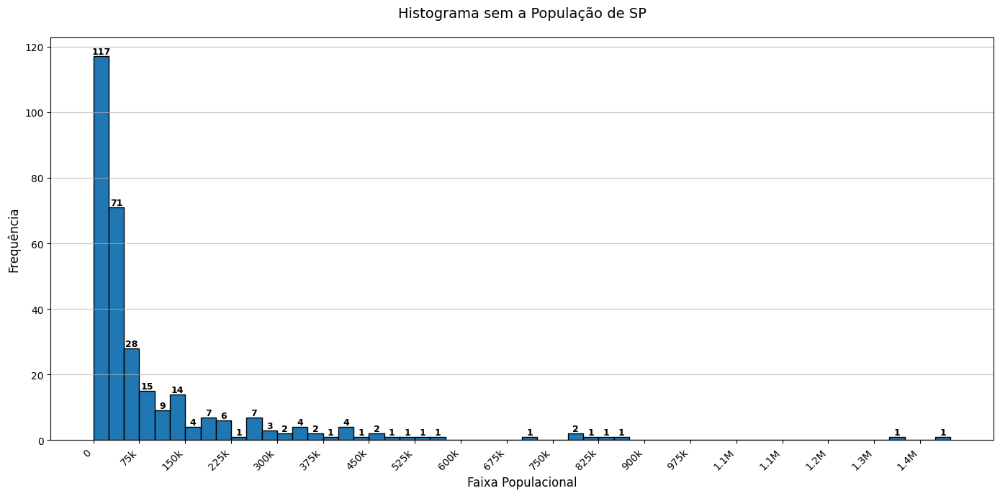

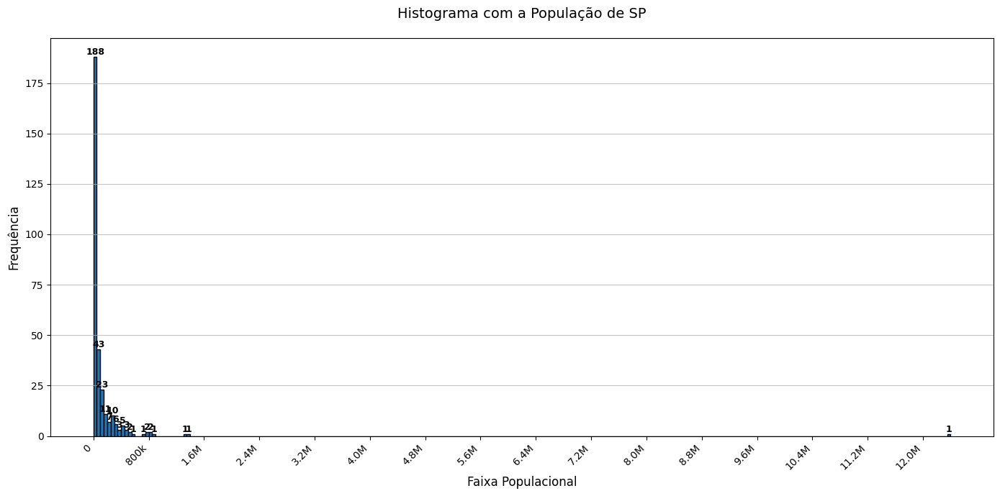

In [10]:
from matplotlib.ticker import FuncFormatter

def hist(df, step_size, col_name, texto):
    """
    Adiciona uma coluna com faixas populacionais ao DataFrame e plota um histograma com rótulos.
    
    Parâmetros:
    df (pd.DataFrame): DataFrame contendo a coluna com população
    step_size (int): Tamanho do intervalo para cada faixa populacional
    col_name (str): Nome da coluna com os dados populacionais
    
    Retorna:
    pd.DataFramD: DataFrame com a coluna adicional 'Faixa_Populacional'
    """
    # Verifica se a coluna existe
    if col_name not in df.columns:
        raise ValueError(f"O DataFrame não contém a coluna '{col_name}'")
    
    # Cria os bins baseados no step size
    # min_pop = df[col_name].min()
    max_pop = df[col_name].max()
    bins = np.arange(0, max_pop + step_size, step_size)
    
    # Adiciona a coluna com as faixas populacionais
    if bins[0] > 1000:
        labels = [f"{bins[i]/1000:.0f}k-{bins[i+1]/1000:.0f}k" for i in range(len(bins)-1)]
    else:
        labels = [f"{bins[i]}-{bins[i+1]}" for i in range(len(bins)-1)]
    df['Faixa_Populacional'] = pd.cut(df[col_name].copy(), bins=bins, labels=labels, include_lowest=True)
    
    # Função para formatar os ticks do eixo x
    def format_ticks(x, pos):
        if x >= 1000000:
            return f"{x/1000000:.1f}M"
        elif x >= 1000:
            return f"{x/1000:.0f}k"
        else:
            return f"{x:.0f}"
    
    # Plota o histograma
    plt.figure(figsize=(14, 7))
    n, bins, patches = plt.hist(df[col_name], bins=bins, edgecolor='black')
    
    # Adiciona rótulos em cada barra
    for i in range(len(patches)):
        if n[i] > 0:  # Só adiciona rótulo se a barra tiver altura > 0
            x = (bins[i] + bins[i+1]) / 2
            y = n[i]
            plt.text(x, y, f"{int(y)}", 
                    ha='center', va='bottom',
                    fontsize=9, fontweight='bold')
    
    plt.title(f'{texto}', fontsize=14, pad=20)
    plt.xlabel('Faixa Populacional', fontsize=12)
    plt.ylabel('Frequência', fontsize=12)
    
    # Aplica a formatação personalizada ao eixo x
    formatter = FuncFormatter(format_ticks)
    plt.gca().xaxis.set_major_formatter(formatter)
    
    # Ajusta os ticks para não ficarem muito densos
    if len(bins) > 15:
        step = max(1, len(bins) // 15)
        plt.xticks(bins[::step], rotation=45, ha='right', fontsize=10)
    else:
        plt.xticks(bins, rotation=45, ha='right', fontsize=10)
    
    plt.yticks(fontsize=10)
    plt.grid(axis='y', alpha=0.75)
    plt.tight_layout()
    plt.show()
    
    return df

# Exemplo de uso:
df_faixa_pop = pd.DataFrame()
df_faixa_pop_sem_sp = df_uf_cid_pop.loc[df_uf_cid_pop['Pop_2022'] < df_uf_cid_pop['Pop_2022'].max(),:].copy()
df_faixa_pop_sem_sp = hist(df_faixa_pop_sem_sp, step_size=25000, col_name='Pop_2022', texto='Histograma sem a População de SP')
df_faixa_pop_sp = hist(df_uf_cid_pop.copy(), step_size=50000, col_name='Pop_2022', texto='Histograma com a População de SP')
df_faixa_pop_sp = df_faixa_pop_sp.loc[df_faixa_pop_sp['Pop_2022'] == df_faixa_pop_sp['Pop_2022'].max(),:]
df_faixa_pop = pd.concat([df_faixa_pop_sem_sp, df_faixa_pop_sp], axis=0)

In [11]:
def criar_demanda(df, k):
    # Parâmetros de demanda
    demanda_total = int(dem_inferida * k * fator_pop_uf)# Demanda total do ano
    populacao_total = df['Pop_2022'].sum()

    # Cálculo da demanda proporcional anual
    df['demanda_anual'] = ((df['Pop_2022'] / populacao_total) * demanda_total).astype(int)

    # Gerando demanda mensal com distribuição Normal
    np.random.seed(42)  # Para resultados reproduzíveis

    meses = lista_meses
    for mes in meses:
        # Distribuição normal: média proporcional e variação de 10% da média
        df[f'demanda_normal_{mes}'] = np.random.normal(
            loc=df['demanda_anual'] / 12,  # Média mensal
            scale=0.5 * (df['demanda_anual'] / 12)  # Desvio padrão
        ).clip(min=0).astype(int)  # Evita valores negativos e converte para inteiros
    if fator_pop_uf == 0.3:
        df
    return df

df_instalacao = criar_demanda(df_uf_cid_pop.copy(), 0.3)
df_desinstalacao = criar_demanda(df_uf_cid_pop.copy(), 0.26)

In [12]:
def aumentar_demanda_e_recalcular_total(df, coluna_demanda, perc):
    """
    Aumenta a demanda de uma coluna específica em 20%, arredondando para cima,
    e recalcula o total anual com base nas novas demandas mensais.

    Parâmetros:
    df (pd.DataFrame): O dataframe que contém as colunas de demanda.
    coluna_demanda (str): O nome da coluna de demanda a ser aumentada (ex: 'demanda_normal_Jan').

    Retorna:
    pd.DataFrame: O dataframe com os valores de demanda atualizados.
    """
    # Aumentar a demanda na coluna específica em 20% e arredondar para cima
    df[coluna_demanda] = np.ceil(df[coluna_demanda] * (1 + perc)).astype(int)

    # Identificar todas as colunas de demanda mensal
    colunas_mensais = [col for col in df.columns if 'demanda_normal_' in col]

    # Recalcular o total anual somando todas as demandas mensais
    df['demanda_anual'] = df[colunas_mensais].sum(axis=1)

    return df

# Aumentar a demanda de 'demanda_normal_Jan' em 20%
df_instalacao = aumentar_demanda_e_recalcular_total(df_instalacao.copy(), 'demanda_normal_Dez', 0.35)
df_desinstalacao = aumentar_demanda_e_recalcular_total(df_desinstalacao.copy(), 'demanda_normal_Jan', 0.30)

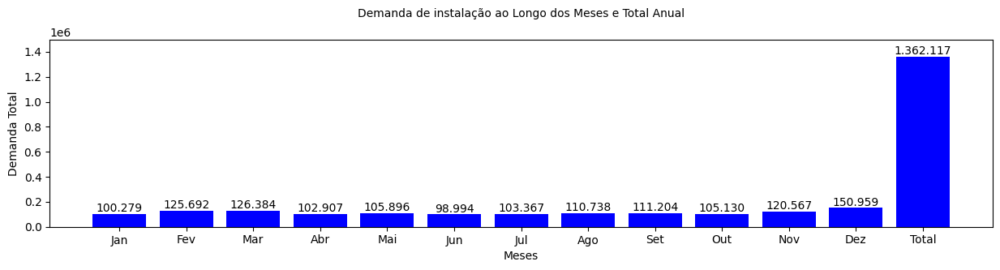

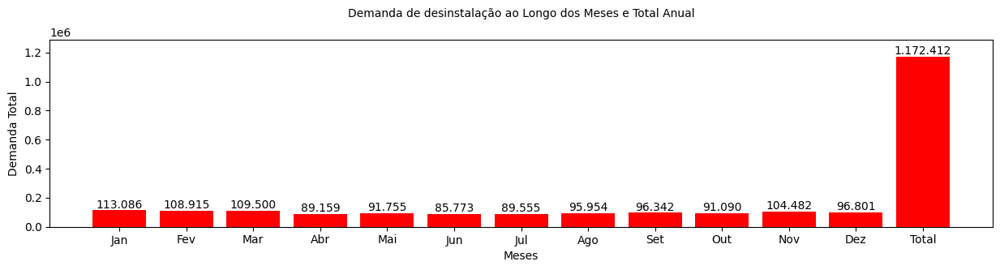

In [13]:
import matplotlib.pyplot as plt

# Definição da lista de meses (exemplo)


def criar_grafico(df_instalacao, texto, clr):
    # Calcular a demanda mensal total
    demanda_mensal_total = df_instalacao[[f'demanda_normal_{mes}' for mes in lista_meses]].sum().values
    demanda_mensal_total = list(demanda_mensal_total)
    demanda_mensal_total.append(sum(demanda_mensal_total))  # Adiciona a soma total no final da lista
    demanda_mensal_total = np.array(demanda_mensal_total)

    # Criar lista de rótulos (meses + Total)
    rotulos = lista_meses + ['Total']

    # Criar o gráfico de barras
    plt.figure(figsize=(15, 3))
    plt.bar(rotulos, demanda_mensal_total, color=clr)
    plt.title(texto, fontsize=10, pad=20)
    plt.xlabel('Meses')
    plt.ylabel('Demanda Total')
    plt.ylim(0, max(demanda_mensal_total) * 1.1)  # Ajustar o limite do eixo y

    # Inserir valores nas barras
    for i, valor in enumerate(demanda_mensal_total):
        plt.text(i, valor, f"{valor:,.0f}".replace(",", "."), ha='center', va='bottom')

    # Exibir o gráfico
    plt.show()

# Exemplo de uso
criar_grafico(df_instalacao, 'Demanda de instalação ao Longo dos Meses e Total Anual', 'b')
criar_grafico(df_desinstalacao, 'Demanda de desinstalação ao Longo dos Meses e Total Anual', 'r')

Gráfico de linhas unificado (demanda_unificada_linha.png) salvo.


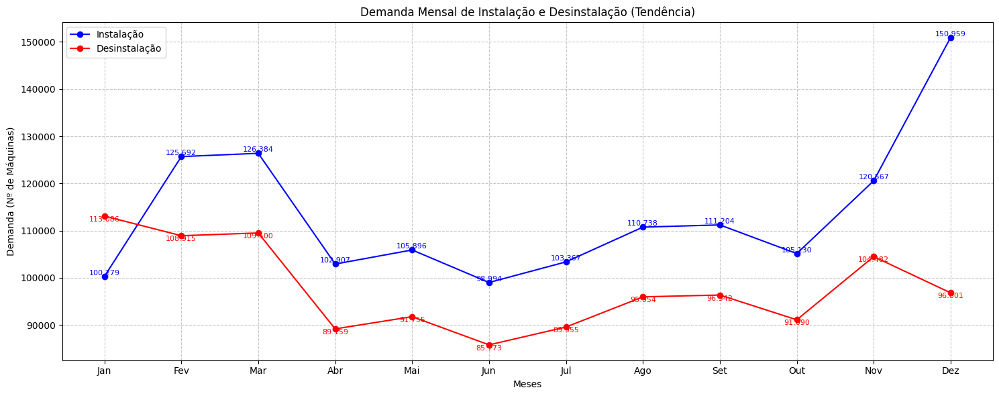

In [14]:
# import numpy as np
# import matplotlib.pyplot as plt
# import pandas as pd

# Funções de Demanda e Lista de Meses (ASSUMIDAS COMO DEFINIDAS NO SEU AMBIENTE)
# Exemplo: lista_meses = list(range(1, 13))

def calcular_demanda_mensal(df, lista_meses):
    """Calcula a demanda mensal total para os 12 meses."""
    colunas_demanda = [f'demanda_normal_{mes}' for mes in lista_meses]
    # Retorna apenas a demanda mensal (12 meses), sem o total no final
    demanda_mensal = df[colunas_demanda].sum().values
    return demanda_mensal

def criar_grafico_unificado(df_instalacao, df_desinstalacao, lista_meses):
    """Cria um gráfico único (de linhas) mostrando as demandas de instalação e desinstalação."""

    # 1. Preparação dos dados
    demanda_inst_mensal = calcular_demanda_mensal(df_instalacao, lista_meses)
    demanda_desinst_mensal = calcular_demanda_mensal(df_desinstalacao, lista_meses)

    # 2. Rótulos (Apenas os meses para o gráfico de linhas de tendência)
    rotulos = [str(mes) for mes in lista_meses]

    # --- Criação do Gráfico de Linhas ---
    plt.figure(figsize=(15, 6))

    # Plotar Demanda de Instalação (Cor Azul)
    plt.plot(rotulos, demanda_inst_mensal, marker='o', linestyle='-', color='b', label='Instalação')

    # Plotar Demanda de Desinstalação (Cor Vermelha)
    plt.plot(rotulos, demanda_desinst_mensal, marker='o', linestyle='-', color='r', label='Desinstalação')

    plt.title('Demanda Mensal de Instalação e Desinstalação (Tendência)')
    plt.xlabel('Meses')
    plt.ylabel('Demanda (Nº de Máquinas)')
    plt.legend(loc='upper left')
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.xticks(rotation=0) # Rotação zero para meses 1-12

    # Inserir valores nos pontos (rótulos de dados)
    # Rótulos para Demanda de Instalação (em cima do ponto)
    for i, valor in enumerate(demanda_inst_mensal):
        plt.text(i, valor, f"{valor:,.0f}".replace(",", "."), ha='center', va='bottom', fontsize=8, color='b')

    # Rótulos para Demanda de Desinstalação (embaixo do ponto)
    for i, valor in enumerate(demanda_desinst_mensal):
        plt.text(i, valor, f"{valor:,.0f}".replace(",", "."), ha='center', va='top', fontsize=8, color='r')

    plt.tight_layout()
    plt.savefig(rf'D:\OneDrive\Documentos\Materiais didáticos\MECAI\Dissertação\script\script\figuras\demanda_unificada_linha_inst_02.png')
    print("Gráfico de linhas unificado (demanda_unificada_linha.png) salvo.")

# # Exemplo de uso (adicione este bloco ao seu código para rodar):
# # Certifique-se de que df_instalacao, df_desinstalacao e lista_meses estão definidos.
criar_grafico_unificado(df_instalacao, df_desinstalacao, lista_meses)

In [15]:
print(f"{100-(df_uf_cid_pop['Pop_2022'].sum() * 100 / 44000000):.2f}%")

-0.93%


In [16]:
df_estq_inicial = df_instalacao.copy()

# Lista das colunas de demanda mensal
colunas_demanda = [
    'demanda_normal_Jan', 'demanda_normal_Fev', 'demanda_normal_Mar',
    'demanda_normal_Abr', 'demanda_normal_Mai', 'demanda_normal_Jun',
    'demanda_normal_Jul', 'demanda_normal_Ago', 'demanda_normal_Set',
    'demanda_normal_Out', 'demanda_normal_Nov', 'demanda_normal_Dez'
]

# Verifica se todas as colunas existem no DataFrame
colunas_existentes = [col for col in colunas_demanda if col in df_estq_inicial.columns]

# Cria a coluna com o valor máximo de demanmensal
df_estq_inicial['max_demanda_mensal'] = df_estq_inicial[colunas_existentes].max(axis=1)

# Opcional: Criar coluna com o mês de maior demanda
df_estq_inicial['mes_max_demanda'] = df_estq_inicial[colunas_existentes].idxmax(axis=1)
df_estq_inicial['mes_max_demanda'] = df_estq_inicial['mes_max_demanda'].str.replace('demanda_normal_', '')

In [17]:
df_demanda_regiao = df_estq_inicial.groupby('Nome da Região Imediata')['max_demanda_mensal'].sum().reset_index()
df_demanda_regiao.rename(columns={'max_demanda_mensal': 'soma_max_demanda_regiao'}, inplace=True)
df_estq_inicial = df_estq_inicial.merge(df_demanda_regiao, on='Nome da Região Imediata', how='inner')
df_estq_inicial = df_estq_inicial.loc[df_estq_inicial['Cód.'].isin(df_cidades_pa['Cód.'].unique()), :].copy()
df_estq_inicial = df_estq_inicial.reset_index(drop=True)

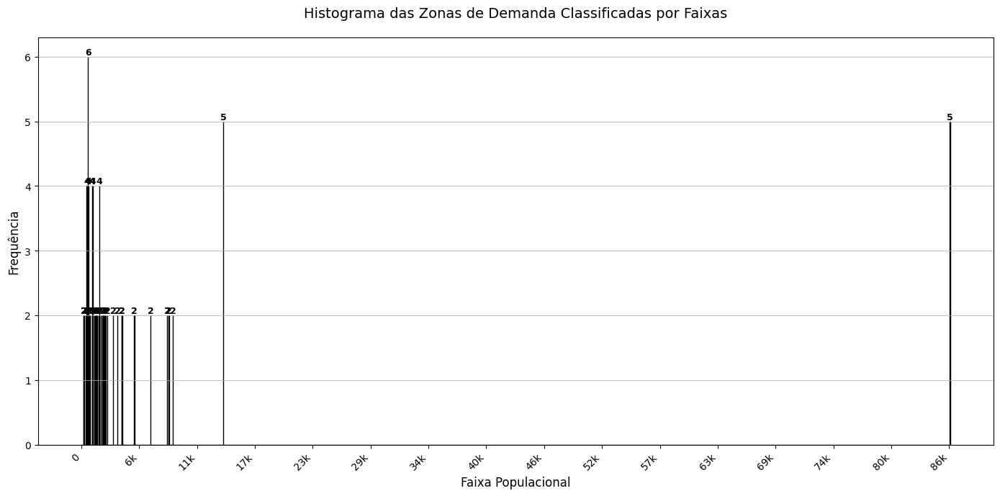

In [18]:
df_estq_inicial = hist(df_estq_inicial.copy(), step_size=25, col_name='soma_max_demanda_regiao', texto='Histograma das Zonas de Demanda Classificadas por Faixas')

In [19]:
df_estq_inicial = df_estq_inicial.rename(columns={'Faixa_Populacional': 'Faixa_Demanda'})
df_estq_inicial['Faixa_Demanda'] = df_estq_inicial['Faixa_Demanda'].str.split('-').str[1].astype(int)
df_estq_inicial['estq_in_b_pa'] = df_estq_inicial['Faixa_Demanda'] * 1
df_estq_inicial['estq_in_r_pa'] = df_estq_inicial['Faixa_Demanda'] * 1

def arredondar_para_cima_multiplo_50(valor):
    return np.ceil(valor / 50) * 50

df_estq_inicial['estq_in_b_pa'] = df_estq_inicial['estq_in_b_pa'].apply(arredondar_para_cima_multiplo_50)
df_estq_inicial['lim_estq_in_pa'] = df_estq_inicial['estq_in_b_pa'] * 2.05
df_estq_inicial['lim_estq_in_pa'] = df_estq_inicial['lim_estq_in_pa'].apply(arredondar_para_cima_multiplo_50)
df_estq_inicial['custo_por_faixa'] = (df_estq_inicial['lim_estq_in_pa']/200)
df_estq_inicial['custo_por_faixa'] = df_estq_inicial['custo_por_faixa'].apply(lambda x: round(x, 0)) * Custo_estq
df_estq_inicial['custo_man_por_faixa'] = df_estq_inicial['custo_por_faixa'] * 0.05
df_estq_inicial['Restr_Rec'] = df_estq_inicial['lim_estq_in_pa'] * 1/2
df_estq_inicial['Restr_Rec'] = df_estq_inicial['Restr_Rec'].apply(lambda x: round(x, 0))
df_estq_inicial['Restr_Env'] = df_estq_inicial['lim_estq_in_pa'] * 1/2
df_estq_inicial['Restr_Env'] = df_estq_inicial['Restr_Env'].apply(lambda x: round(x, 0))
colunas = ['Cód.', 'nome_cidade', 'soma_max_demanda_regiao', 'Faixa_Demanda', 'estq_in_b_pa', 'estq_in_r_pa', 'lim_estq_in_pa', 'Restr_Rec', \
           'Restr_Env', 'custo_por_faixa', 'custo_man_por_faixa']
df_estq_inicial = df_estq_inicial[colunas]

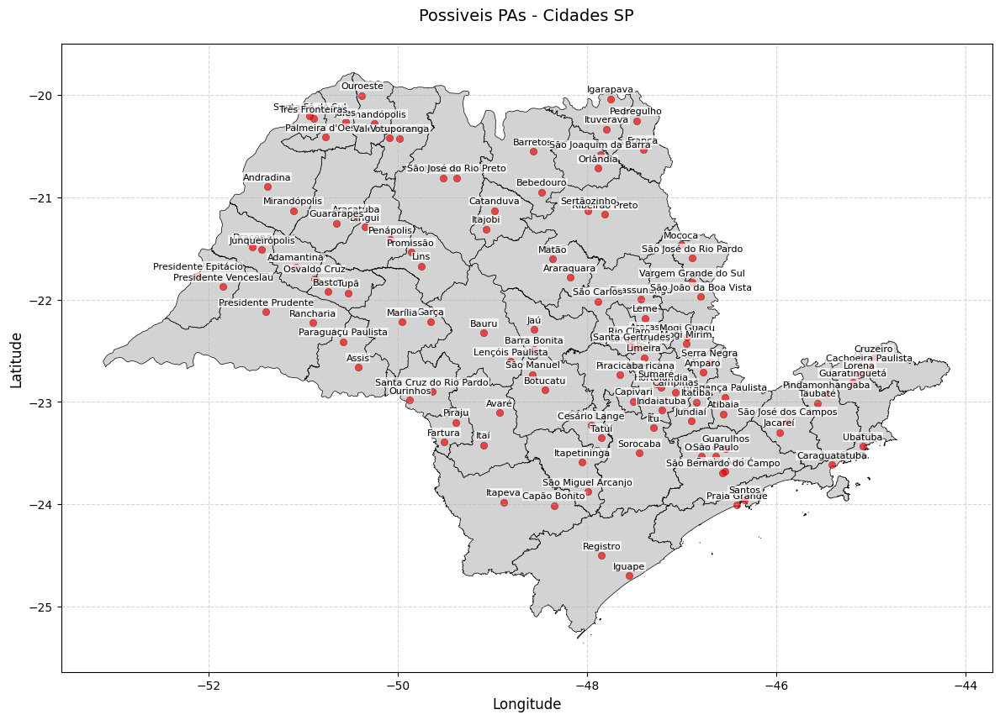

In [20]:
def plotar_grafico(df, geo_df):
    # Criar a figura e os eixos
    fig, ax = plt.subplots(figsize=(12, 10))
    
    # Plotar o mapa base
    geo_df.plot(ax=ax, color='lightgray', edgecolor='black', linewidth=0.5)
    
    # Plotar os clusters agrupados por referência
    for ref, group in df.groupby('nome_cidade'):  # Ou outra coluna de referência
        ax.scatter(
            group['longitude_cidade'],  # Corrigido para usar longitude_cidade
            group['latitude_cidade'],   # Corrigido para usar latitude_cidade
            color='red',
            alpha=0.7,
            edgecolor='black',
            linewidth=0.3,
            label=ref
        )
        
        # Adicionar rótulos das cidades
        for _, row in group.iterrows():
            ax.text(
                row['longitude_cidade'],
                row['latitude_cidade'] + 0.05,
                row['nome_cidade'],  # Corrigido para usar nome_cidade,
                fontsize=8,
                ha='center',
                va='bottom',
                bbox=dict(facecolor='white', alpha=0.7, edgecolor='none', pad=0.5)
            )
    
    # Configurações adicionais
    ax.set_xlabel('Longitude', fontsize=12)
    ax.set_ylabel('Latitude', fontsize=12)
    ax.set_title('Possiveis PAs - Cidades SP', fontsize=14, pad=20)
    ax.grid(True, linestyle='--', alpha=0.5)
    
    # Ajustar layout
    plt.tight_layout()
    plt.show()

plotar_grafico(df_cidades_pa, geo_df)

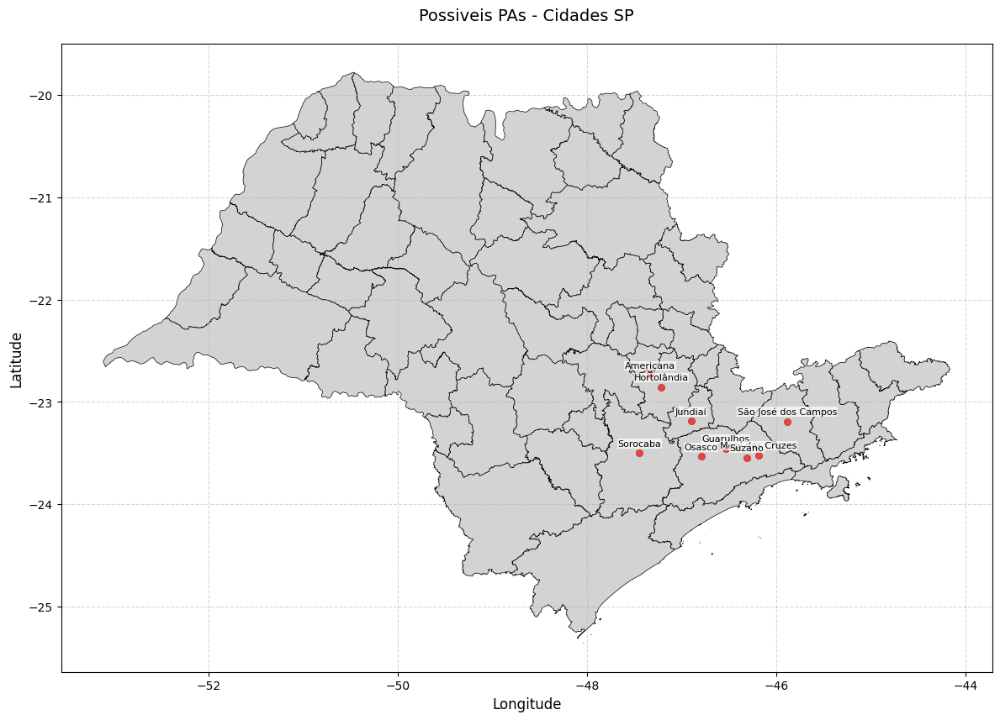

In [21]:
lista_cidades_cds = ['Suzano', 'Guarulhos', 'Mogi das Cruzes', 'Osasco', 'Cajamar', 'São José dos Campos',
                     'Hortolândia', 'Jundiaí', 'Jaguariúna', 'Americana', 'Sorocaba']
df_cidades_cd = df_uf_cid_pop.loc[df_uf_cid_pop['nome_cidade'].isin(lista_cidades_cds), :].copy()
plotar_grafico(df_cidades_cd, geo_df)

In [22]:
list(df_cidades_cd['nome_cidade'])

['Americana',
 'Guarulhos',
 'Hortolândia',
 'Jundiaí',
 'Mogi das Cruzes',
 'Osasco',
 'São José dos Campos',
 'Sorocaba',
 'Suzano']

In [23]:
import math

def haversine_distance(lat1, lon1, lat2, lon2):
    # Converter graus para radianos
    lat1, lon1, lat2, lon2 = map(math.radians, [lat1, lon1, lat2, lon2])

    # Diferença entre as coordenadas
    dlat = lat2 - lat1
    dlon = lon2 - lon1

    # Fórmula de Haversine
    a = math.sin(dlat / 2)**2 + math.cos(lat1) * math.cos(lat2) * math.sin(dlon / 2)**2
    c = 2 * math.asin(math.sqrt(a))

    # Raio da Terra em quilômetros
    r = 6371

    # Calcular a distância
    distance = c * r

    return int(distance)

In [24]:
df_cidades_pa['PA'] = [f'PA_{i:04d}' for i in range(1,len(df_cidades_pa)+1)]
df_cidades_cd['CD'] = [f'CD_{i:04d}' for i in range(1,len(df_cidades_cd)+1)]
df_estq_inicial = df_estq_inicial.merge(df_cidades_pa.loc[:,['Cód.', 'PA']], how='inner', left_on='Cód.', right_on='Cód.')
df_estq_inicial = df_estq_inicial.sort_values(by='PA').reset_index(drop=True)

In [25]:
def compute_distances(row, centroids, prfx, lat, lon):
    distances = {}
    for p, (j_lat, j_long) in zip(prfx, zip(centroids['latitude_cidade'], centroids['longitude_cidade'])):
        distances[p] = haversine_distance(row[lat], row[lon], j_lat, j_long)
    return pd.Series(distances)

centroids = df_cidades_pa[['latitude_cidade', 'longitude_cidade']]
df_dist_ZD_PA = df_instalacao[['uf', 'nome_cidade', 'latitude_cidade', 'longitude_cidade']].copy()
df_dist_ZD_PA['ZD'] = [f'ZD_{i:04d}' for i in range(1, len(df_dist_ZD_PA['nome_cidade']) + 1)]
distances_df = df_dist_ZD_PA.apply(
    compute_distances, centroids=centroids, prfx=df_cidades_pa['PA'], lat='latitude_cidade', lon='longitude_cidade', axis=1
)
df_dist_ZD_PA = pd.concat([df_dist_ZD_PA, distances_df], axis=1)

In [26]:
all_clusters_centroid = df_cidades_cd[['latitude_cidade', 'longitude_cidade']].drop_duplicates()
all_clusters_centroid.reset_index(drop=True)

centroids = df_cidades_pa[['latitude_cidade', 'longitude_cidade']].copy().drop_duplicates().reset_index(drop=True)
df_dist_CD_PA = df_cidades_cd.loc[:, ['latitude_cidade', 'longitude_cidade']].copy().drop_duplicates().reset_index(drop=True)
df_dist_CD_PA.loc[:, 'CD'] = [f'CD_{i:04d}' for i in range(1, len(df_dist_CD_PA['latitude_cidade'])+1)]
distances_df = df_dist_CD_PA.apply(compute_distances, centroids=centroids, prfx=df_cidades_pa['PA'], lat='latitude_cidade', lon='longitude_cidade', axis=1)
df_dist_CD_PA = pd.concat([df_dist_CD_PA, distances_df], axis=1)

In [27]:
import pandas as pd
from geopy.distance import geodesic
from joblib import Parallel, delayed

# Função para encontrar a cidade mais próxima
def find_nearest_city(row, df1):
    distances = df1.apply(lambda x: geodesic((row['latitude_cidade'], row['longitude_cidade']), (x['latitude_cidade'], x['longitude_cidade'])).km, axis=1)
    nearest_city = df1.loc[distances.idxmin(), ['nome_cidade', 'uf']]
    return nearest_city['nome_cidade'], nearest_city['uf']

# Função para paralelizar o processamento
def process_row(row, df1):
    cidade, uf = find_nearest_city(row, df1)
    return row['latitude_cidade'], row['longitude_cidade'], cidade, uf

df_cluster_cds_cities = df_cidades_cd[['latitude_cidade', 'longitude_cidade']].drop_duplicates()
results = Parallel(n_jobs=-1)(delayed(process_row)(row, df_uf_cid_pop) for index, row in df_cluster_cds_cities.iterrows())

df_cluster_cds_cities = pd.DataFrame(results, columns=['latitude_cidade', 'longitude_cidade', 'cidade', 'uf'])
df_cluster_cds_cities['CD'] = [f'CD_{(idx+1):04d}' for idx, vl in enumerate(df_cluster_cds_cities['uf'])]

In [28]:
def dist_min(df, txt_col):
    dict_min_idx = {}
    for each in df.columns:
        if txt_col in each:
            dict_min_idx[each] = df[each].idxmin()
    df_new = df.iloc[list(dict_min_idx.values()), :].copy()
    df_new['PA'] = pd.Series(list(dict_min_idx.keys()), index=list(dict_min_idx.values()))
    return df_new


df_cluster_pa_cities = dist_min(df_dist_ZD_PA, 'PA_')
columns_to_keep = [col for col in df_cluster_pa_cities.columns if not (col.startswith('PA_') or col == 'ZD')]
df_cluster_pa_cities = df_cluster_pa_cities.loc[:, columns_to_keep].reset_index(drop=True)
df_cluster_pa_cities = df_cluster_pa_cities.merge(df_cidades_pa.loc[:,['PA']], how='inner', on='PA')

In [29]:
# def compute_distances(row, centroids, prfx, lat, lon):
#     distances = {}
#     for p, (j_lat, j_long) in zip(prfx, zip(centroids['latitude_cidade'], centroids['longitude_cidade'])):
#         distances[p] = haversine_distance(row[lat], row[lon], j_lat, j_long)
#     return pd.Series(distances)

centroids = df_cidades_pa[['latitude_cidade', 'longitude_cidade']]
df_dist_ZD_PA = df_instalacao[['uf', 'nome_cidade', 'latitude_cidade', 'longitude_cidade']].copy()
df_dist_ZD_PA['ZD'] = [f'ZD_{i:04d}' for i in range(1, len(df_dist_ZD_PA['nome_cidade']) + 1)]
distances_df = df_dist_ZD_PA.apply(
    compute_distances, centroids=centroids, prfx=df_cidades_pa['PA'], lat='latitude_cidade', lon='longitude_cidade', axis=1
)
df_dist_ZD_PA = pd.concat([df_dist_ZD_PA, distances_df], axis=1)

In [30]:
all_clusters_centroid = df_cidades_cd[['latitude_cidade', 'longitude_cidade']].drop_duplicates()
all_clusters_centroid.reset_index(drop=True)

centroids = df_cidades_pa[['latitude_cidade', 'longitude_cidade']].copy().drop_duplicates().reset_index(drop=True)
df_dist_CD_PA = df_cidades_cd.loc[:, ['latitude_cidade', 'longitude_cidade', 'CD']].copy().drop_duplicates().reset_index(drop=True)
distances_df = df_dist_CD_PA.apply(compute_distances, centroids=centroids, prfx=df_cidades_pa['PA'], lat='latitude_cidade', lon='longitude_cidade', axis=1)
df_dist_CD_PA = pd.concat([df_dist_CD_PA, distances_df], axis=1)

In [31]:
data = {
    'latitude_cidade': [-23.498691525888947],
    'longitude_cidade': [-46.82929671760887],
    'UF': ['SP'],
    'CIDADE': ['Osasco'],
    'FAB': ['F_1']
}
df_fab = pd.DataFrame(data)

df_dist_Fab_CD = df_fab
centroids = df_cluster_cds_cities[['latitude_cidade', 'longitude_cidade']].copy().drop_duplicates().reset_index(drop=True)
distances_df = df_dist_Fab_CD.apply(compute_distances, centroids=centroids, prfx=df_cluster_cds_cities['CD'], lat='latitude_cidade', lon='longitude_cidade', axis=1)
df_dist_Fab_CD = pd.concat([df_dist_Fab_CD, distances_df], axis=1)

In [32]:
data = {
    'latitude_cidade': [-23.424952010146395],
    'longitude_cidade': [-46.563427262191276],
    'UF': ['SP'],
    'CIDADE': ['Guarulhos'],
    'DESC': ['D_1']
}
df_desc = pd.DataFrame(data)

df_dist_CD_Desc = df_desc
centroids = df_cluster_cds_cities[['latitude_cidade', 'longitude_cidade']].copy().drop_duplicates().reset_index(drop=True)
distances_df = df_dist_CD_Desc.apply(compute_distances, centroids=centroids, prfx=df_cluster_cds_cities['CD'], lat='latitude_cidade', lon='longitude_cidade', axis=1)
df_dist_CD_Desc = pd.concat([df_dist_CD_Desc, distances_df], axis=1)

In [33]:
df1 = df_dist_ZD_PA[['uf', 'ZD']]
df2 = df_cluster_pa_cities[['uf', 'PA']]

# Criar a lista de ZD e PA únicos
zd_list = df1['ZD'].unique()
pa_list = df2['PA'].unique()

# Inicializar a matriz de zeros
matrix = pd.DataFrame(np.zeros((len(pa_list), len(zd_list))), index=pa_list, columns=zd_list).astype('int')

# Preencher a matriz com 1s onde 'uf' são iguais
for idx_pa, row_pa in df2.iterrows():
    for idx_zd, row_zd in df1.iterrows():
        if row_pa['uf'] == row_zd['uf']:
            matrix.at[row_pa['PA'], row_zd['ZD']] = 1
matrix.reset_index(inplace=True)
matrix.rename(columns={'index': 'PA'}, inplace=True)
df_regiao_pa_zd = pd.DataFrame(matrix)

In [34]:
df_merged = pd.merge(df_instalacao, df_dist_ZD_PA[['nome_cidade', 'ZD']],
                     on='nome_cidade', # 'on' pode ser usado quando as colunas têm o mesmo nome
                     how='left',
                     suffixes=('_original', '_novo')) # Sufixos mais descritivos para ZD
df_merged['ZD_original'] = df_merged['ZD_novo'].fillna(df_merged['ZD_original'])
df_instalacao = df_merged.rename(columns={'ZD_original': 'ZD'}).drop(columns=['ZD_novo'])

df_merged = pd.merge(df_desinstalacao, df_dist_ZD_PA[['nome_cidade', 'ZD']],
                     on='nome_cidade', # 'on' pode ser usado quando as colunas têm o mesmo nome
                     how='left',
                     suffixes=('_original', '_novo')) # Sufixos mais descritivos para ZD
df_merged['ZD_original'] = df_merged['ZD_novo'].fillna(df_merged['ZD_original'])
df_desinstalacao = df_merged.rename(columns={'ZD_original': 'ZD'}).drop(columns=['ZD_novo'])

In [35]:
dir = rf'D:\OneDrive\Documentos\Materiais didáticos\MECAI\Dissertação\script\Dados Gerados Mestrado\Auxiliar'

df_cluster_cds_cities.to_csv(os.path.join(dir, 'df_cluster_cds_cities.csv'), index=False) # OK
df_cluster_pa_cities.to_csv(os.path.join(dir, 'df_cluster_pa_cities.csv'), index=False) # OK
df_dist_CD_PA.to_csv(os.path.join(dir, 'df_dist_CD_PA.csv'), index=False) # OK
df_dist_ZD_PA.to_csv(os.path.join(dir, 'df_dist_ZD_PA.csv'), index=False) # OK
df_instalacao.to_csv(os.path.join(dir, 'df_instalacao.csv'), index=False) # OK
df_desinstalacao.to_csv(os.path.join(dir, 'df_desinstalacao.csv'), index=False) # OK
df_dist_Fab_CD.to_csv(os.path.join(dir, 'df_dist_Fab_CD.csv'), index=False) # OK
df_dist_CD_Desc.to_csv(os.path.join(dir, 'df_dist_CD_Desc.csv'), index=False) # OK
df_regiao_pa_zd.to_csv(os.path.join(dir, 'df_regiao_pa_zd.csv'), index=False) # OK
df_estq_inicial.to_csv(os.path.join(dir, 'df_estq_inicial.csv'), index=False) # OK

In [36]:
def demanda_progr(df, nome, output_dir):
    colunas = [f'demanda_normal_{each}' for each in lista_meses]
    
    for i in range(len(colunas)):
        list_col = list(df.iloc[:, 0:18].columns)  # Get the first 18 columns
        if i > 0:
            list_col.append(colunas[i-1])  # Add the previous month's column
        list_col.append(colunas[i])  # Add the current month's column
        
        # Ensure list_col is flat
        df_aux = df.loc[:, list_col]
        
        # Save the resulting DataFrame to a CSV file
        output_file = os.path.join(output_dir, f'{nome}_{i+1:02}.csv')
        df_aux.to_csv(output_file, index=False)

demanda_progr(df_instalacao, 'df_dem_inst', dir)
demanda_progr(df_desinstalacao, 'df_dem_desinst', dir)

In [37]:
df_teste = pd.merge(df_instalacao, df_cidades_pa.loc[:,['codigo_ibge']], on='codigo_ibge', how='inner')

In [38]:
list_col_dem_meses = [ each_col for each_col in df_teste.columns for each in lista_meses if each in each_col]
df_demanda_total = df_teste[list_col_dem_meses]
df_demanda_total['TOTAL'] = df_demanda_total.iloc[:,1:].sum(axis=1)
df_demanda_total.nlargest(5, 'TOTAL')

C:\Users\rpafe\AppData\Local\Temp\ipykernel_23232\324388124.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_demanda_total['TOTAL'] = df_demanda_total.iloc[:,1:].sum(axis=1)


,demanda_normal_Jan,demanda_normal_Fev,demanda_normal_Mar,demanda_normal_Abr,demanda_normal_Mai,demanda_normal_Jun,demanda_normal_Jul,demanda_normal_Ago,demanda_normal_Set,demanda_normal_Out,demanda_normal_Nov,demanda_normal_Dez,TOTAL
99,23726,47816,42899,23888,19516,20533,25034,34427,33386,30699,38115,37952,354265
34,3154,2147,3462,918,1086,5386,4449,2268,3357,3996,4693,1913,33675
19,3747,5695,2672,3147,3356,1687,1954,2256,1216,2355,2246,4177,30761
102,1453,2939,1228,785,2681,3066,2330,2785,2929,2882,2158,4113,27896
83,1288,1343,2120,2196,3587,2571,780,2186,2899,2089,2578,5475,27824
